## OpenAI Setup

In [ ]:
from getpass import getpass
openaikey = getpass('Enter the openai key: ')

In [ ]:
chatgpt_url = "https://api.openai.com/v1/chat/completions"
chatgpt_headers = {
    "content-type": "application/json",
    "Authorization":"Bearer {}".format(openaikey)}

In [ ]:
!pip install --quiet ipython-autotime
%load_ext autotime

time: 433 µs (started: 2024-01-14 16:27:18 +00:00)


## 1. Get image description and script using OpenAI

In [ ]:
import requests
import json
from pprint import pprint

def fetch_imagedescription_and_script(prompt,url,headers):

    # Define the payload for the chat model
    messages = [
        {"role": "system", "content": "You are an expert short form video script writer for Instagram Reels and Youtube shorts."},
        {"role": "user", "content": prompt}
    ]

    chatgpt_payload = {
        "model": "gpt-3.5-turbo-16k",
        "messages": messages,
        "temperature": 1.3,
        "max_tokens": 2000,
        "top_p": 1,
        "stop": ["###"]
    }

    # Make the request to OpenAI's API
    response = requests.post(url, json=chatgpt_payload, headers=headers)
    response_json = response.json()

    # Extract data from the API's response
    print(response_json)
    output = json.loads(response_json['choices'][0]['message']['content'].strip())
    pprint (output)
    image_prompts = [k['image_description'] for k in output]
    texts = [k['text'] for k in output]

    return image_prompts, texts




time: 1.15 ms (started: 2024-01-14 16:27:21 +00:00)


In [ ]:
# Daily motivation, personal growth and positivity

# topic = "Success and Achievement"
# goal = "inspire people to overcome challenges, achieve success and celebrate their victories"

# topic = "Morning afformations"
# goal = "Encourage viewers to start their day with a positive mindset."

topic = "Self-Care and Wellness"
goal = "offer tips and reminders for self-care practices, stress reduction, and maintaining overall well-being"

# topic = "Gratitude and Positivity"
# goal = "emphasize gratitude and positive thinking"

# topic = "Boost Confidence"
# goal = "help build self-confidence and self-esteem"

# topic = "Happiness and Joy"
# goal = "help people find happiness in simple moments and enjoy life's journey"

# topic = "Resilience and Adversity"
# goal = "help build resilience in the face of adversity"

# topic = "Relationships and Connections"
# goal = "help build meaningful relationships, foster connections, and spread love"

# topic = "Mindfulness and Presence"
# goal = "encourage mindfulness and being present in the moment"

# topic = "Empowerment"
# goal = "empower viewers to take control of their lives, make positive choices, and pursue their dreams"

# topic = "Time Management and Productivity"
# goal = "provide tips about managing time effectively, staying organized, and being productive"

prompt_prefix = """You are tasked with creating a script for a {} video that is about 30 seconds.
Your goal is to {}.
Please follow these instructions to create an engaging and impactful video:
1. Begin by setting the scene and capturing the viewer's attention with a captivating visual.
2. Each scene cut should occur every 5-10 seconds, ensuring a smooth flow and transition throughout the video.
3. For each scene cut, provide a detailed description of the stock image being shown.
4. Along with each image description, include a corresponding text that complements and enhances the visual. The text should be concise and powerful.
5. Ensure that the sequence of images and text builds excitement and encourages viewers to take action.
6. Strictly output your response in a JSON list format, adhering to the following sample structure:""".format(topic,goal)

sample_output="""
   [
       { "image_description": "Description of the first image here.", "text": "Text accompanying the first scene cut." },
       { "image_description": "Description of the second image here.", "text": "Text accompanying the second scene cut." },
       ...
   ]"""

prompt_postinstruction="""By following these instructions, you will create an impactful {} short-form video.
Output:""".format(topic)

prompt = prompt_prefix + sample_output + prompt_postinstruction

image_prompts, texts = fetch_imagedescription_and_script(prompt,chatgpt_url,chatgpt_headers)
print("image_prompts: ", image_prompts)
print("texts: ", texts)
print (len(texts))

{'id': 'chatcmpl-8gxcQ9OHcrtkzYBZ12UMiJ6MWRVwj', 'object': 'chat.completion', 'created': 1705249642, 'model': 'gpt-3.5-turbo-16k-0613', 'choices': [{'index': 0, 'message': {'role': 'assistant', 'content': '[\n    {\n        "image_description": "A person meditating outside, with sunlight filtering through the trees.",\n        "text": "Take a moment to connect with nature and find inner peace."\n    },\n    {\n        "image_description": "A close-up of a person\'s hand holding a burning match with a journal nearby.",\n        "text": "Reflect on your thoughts and feelings, journaling can be a mind-clearing practice."\n    },\n    {\n        "image_description": "A colorful smoothie bowl topped with fruits, seeds, and granola.",\n        "text": "Nourish your body with wholesome and vibrant foods."\n    },\n    {\n        "image_description": "A person in workout clothes doing a yoga pose on a yoga mat.",\n        "text": "Stretch your body and practice yoga to release tension and impr

## 2. Generate images for that descriptions using [Segmind's](https://www.segmind.com/) API

In [ ]:
segmind_apikey = getpass('Enter the openai key: ')

In [ ]:
import uuid

current_uuid = uuid.uuid4()
current_foldername = str(current_uuid)
print (current_foldername)

db9ed141-11b9-41a4-9d26-1cfdccdf76c3


In [ ]:
import os
import io
import requests
from PIL import Image
import random

def generate_images(prompts, fname):
    url = "https://api.segmind.com/v1/sdxl1.0-txt2img"

    headers = {'x-api-key': segmind_apikey}

    # Create a folder for the UUID if it doesn't exist
    if not os.path.exists(fname):
        os.makedirs(fname)

    num_images = len(prompts)

    currentseed = random.randint(1, 1000000)
    print ("seed ",currentseed)

    for i, prompt in enumerate(prompts):

        final_prompt = "((perfect quality)), ((cinematic photo:1.3)), ((raw candid)), 4k, {}, no occlusion, Fujifilm XT3, highly detailed, bokeh, cinemascope".format(prompt.strip('.'))
        data = {
            "prompt": final_prompt,
            "negative_prompt": "((deformed)), ((limbs cut off)), ((quotes)), ((extra fingers)), ((deformed hands)), extra limbs, disfigured, blurry, bad anatomy, absent limbs, blurred, watermark, disproportionate, grainy, signature, cut off, missing legs, missing arms, poorly drawn face, bad face, fused face, cloned face, worst face, three crus, extra crus, fused crus, worst feet, three feet, fused feet, fused thigh, three thigh, fused thigh, extra thigh, worst thigh, missing fingers, extra fingers, ugly fingers, long fingers, horn, extra eyes, amputation, disconnected limbs",
            "style": "hdr",
            "samples": 1,
            "scheduler": "UniPC",
            "num_inference_steps": 30,
            "guidance_scale": 8,
            "strength": 1,
            "seed": currentseed,
            "img_width": 1024,
            "img_height": 1024,
            "refiner": "yes",
            "base64": False
                  }

        response = requests.post(url, json=data, headers=headers)

        if response.status_code == 200 and response.headers.get('content-type') == 'image/jpeg':
            image_data = response.content
            image = Image.open(io.BytesIO(image_data))

            image_filename = os.path.join(fname, f"{i + 1}.jpg")
            image.save(image_filename)

            print(f"Image {i + 1}/{num_images} saved as '{image_filename}'")
        else:
            print (response.text)
            print(f"Error: Failed to retrieve or save image {i + 1}")




In [ ]:
generate_images(image_prompts, current_foldername)

seed  210673
Image 1/9 saved as 'db9ed141-11b9-41a4-9d26-1cfdccdf76c3/1.jpg'
Image 2/9 saved as 'db9ed141-11b9-41a4-9d26-1cfdccdf76c3/2.jpg'
Image 3/9 saved as 'db9ed141-11b9-41a4-9d26-1cfdccdf76c3/3.jpg'
Image 4/9 saved as 'db9ed141-11b9-41a4-9d26-1cfdccdf76c3/4.jpg'
Image 5/9 saved as 'db9ed141-11b9-41a4-9d26-1cfdccdf76c3/5.jpg'
<!doctype html>
<html lang=en>
<title>429 Too Many Requests</title>
<h1>Too Many Requests</h1>
<p>5 per 1 minute</p>

Error: Failed to retrieve or save image 6
<!doctype html>
<html lang=en>
<title>429 Too Many Requests</title>
<h1>Too Many Requests</h1>
<p>5 per 1 minute</p>

Error: Failed to retrieve or save image 7
<!doctype html>
<html lang=en>
<title>429 Too Many Requests</title>
<h1>Too Many Requests</h1>
<p>5 per 1 minute</p>

Error: Failed to retrieve or save image 8
<!doctype html>
<html lang=en>
<title>429 Too Many Requests</title>
<h1>Too Many Requests</h1>
<p>5 per 1 minute</p>

Error: Failed to retrieve or save image 9


## 2.1 Visualize generated images

In [ ]:
!pip install --quiet ipyplot

time: 4.12 s (started: 2024-01-14 16:27:58 +00:00)


In [ ]:
import os
from PIL import Image

def read_images_from_folder(folder_path):
    image_objects = []

    # Get a list of filenames in the folder and sort them based on their numeric values
    filenames = [filename for filename in os.listdir(folder_path) if filename.lower().endswith(".jpg")]
    filenames = sorted(filenames, key=lambda x: int(x.split('.')[0]))
    print (filenames)

    for filename in filenames:
        image_path = os.path.join(folder_path, filename)
        image = Image.open(image_path)
        image_objects.append(image)

    return image_objects

time: 564 µs (started: 2024-01-14 16:28:02 +00:00)


In [ ]:
images = read_images_from_folder(current_foldername)

['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg']
time: 3.12 ms (started: 2024-01-14 16:28:02 +00:00)


  return np.asarray(seq, dtype=type(seq[0]))




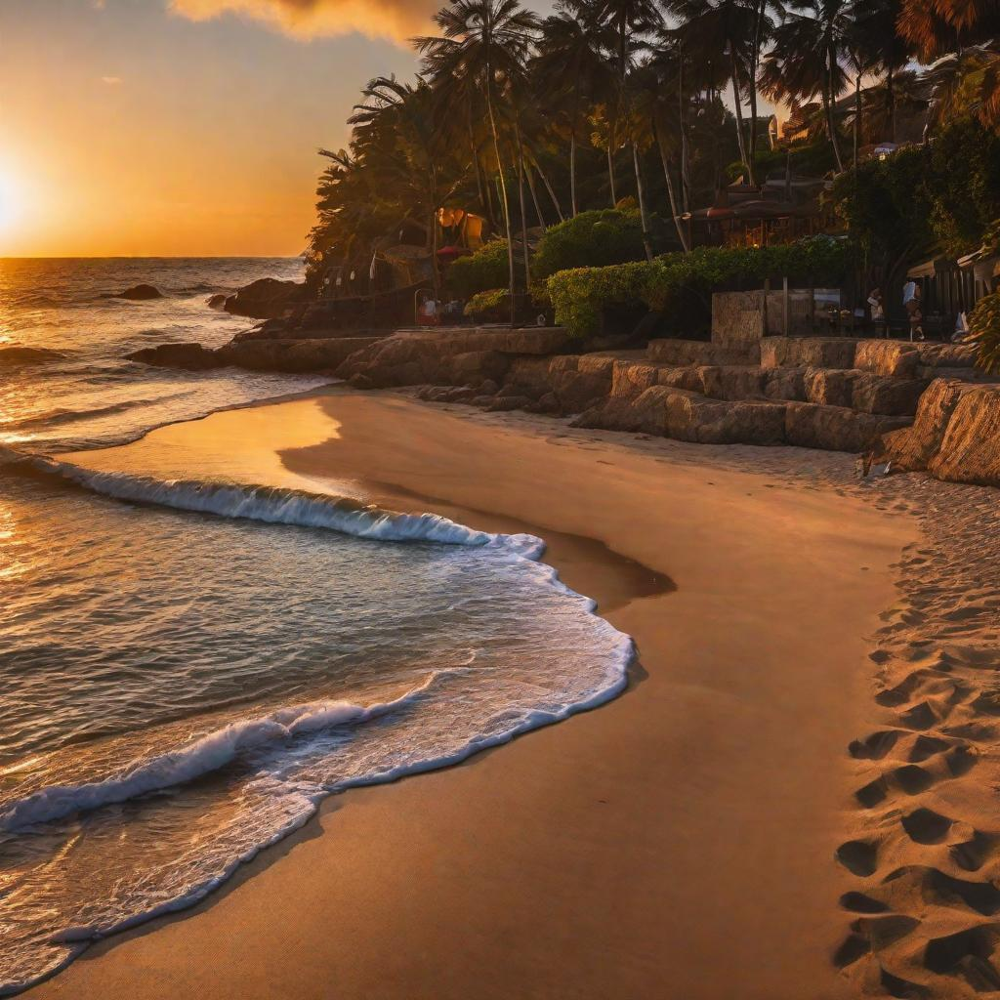
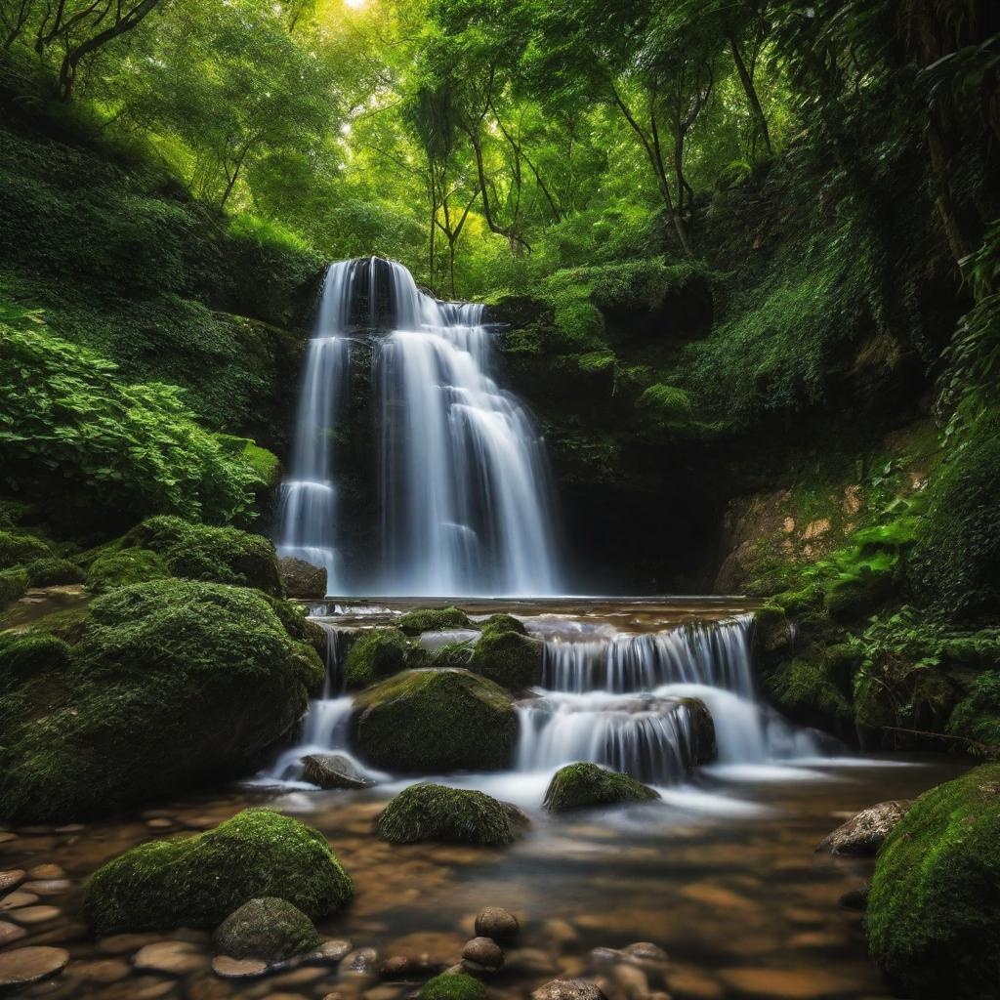
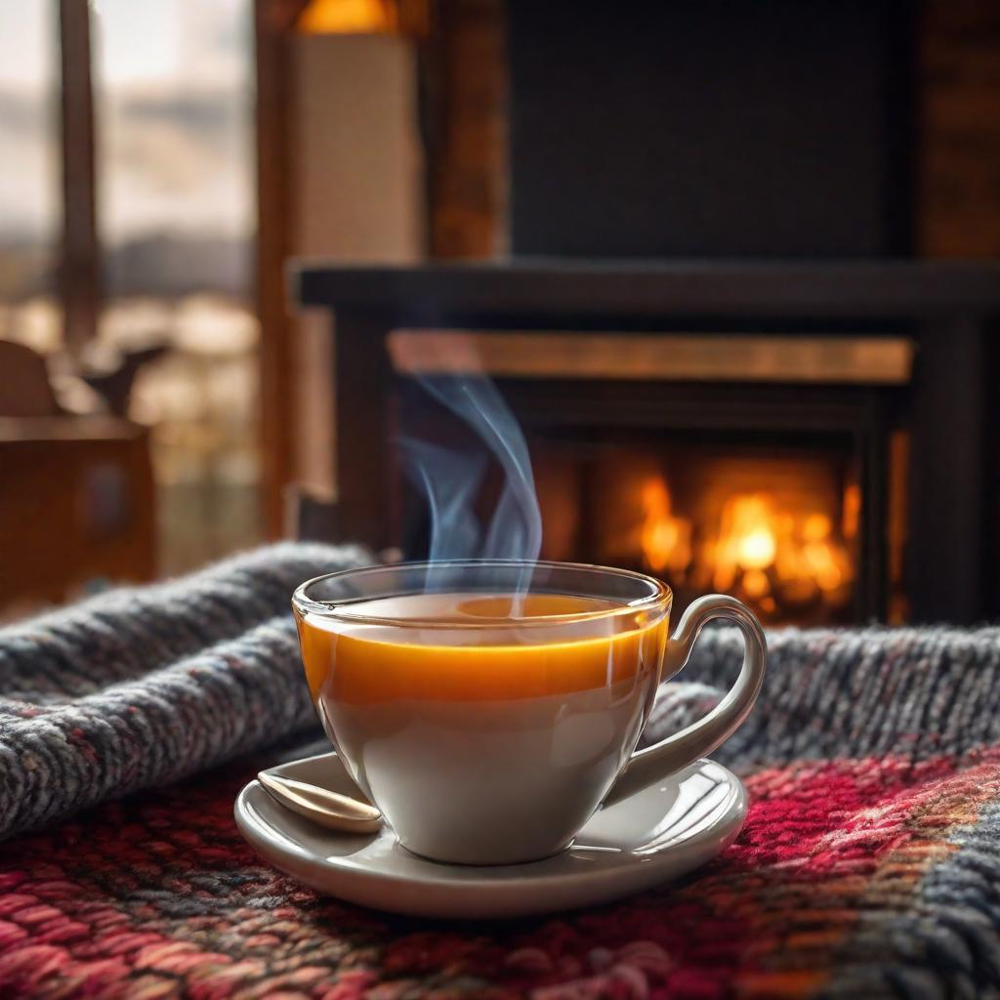
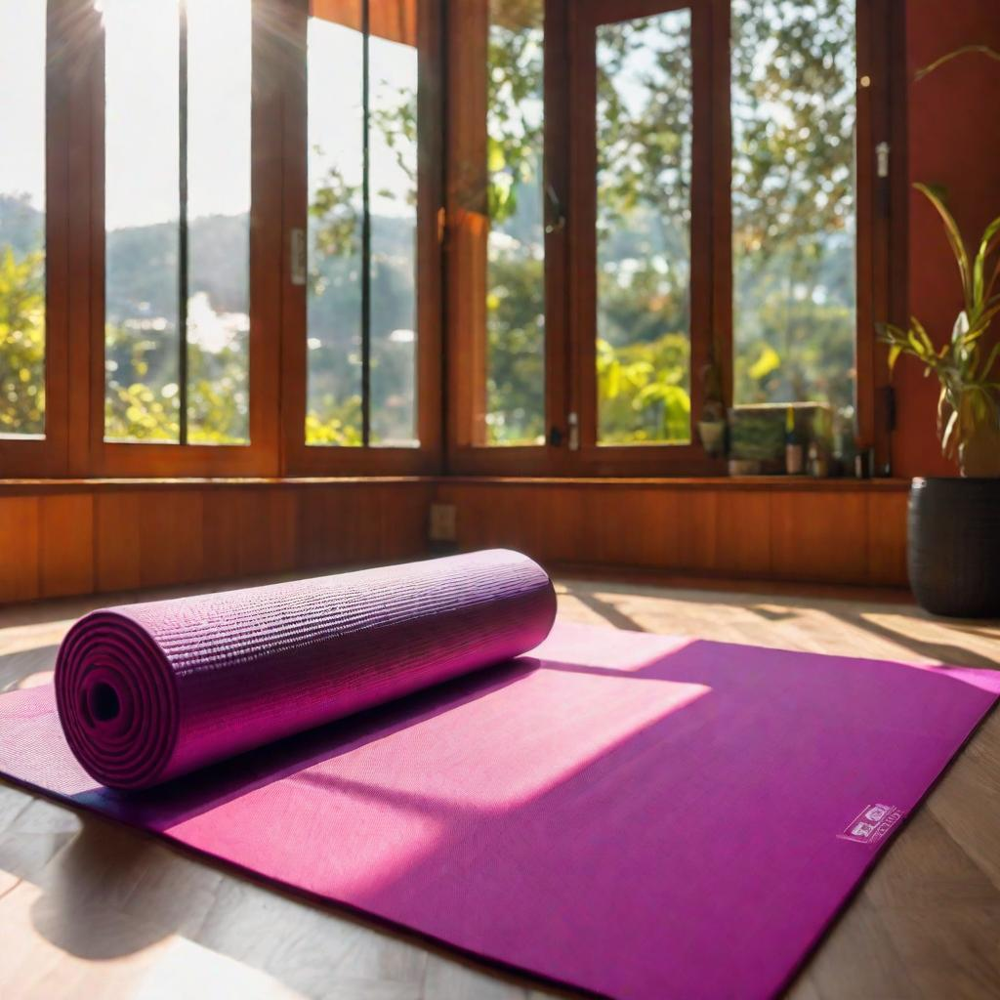
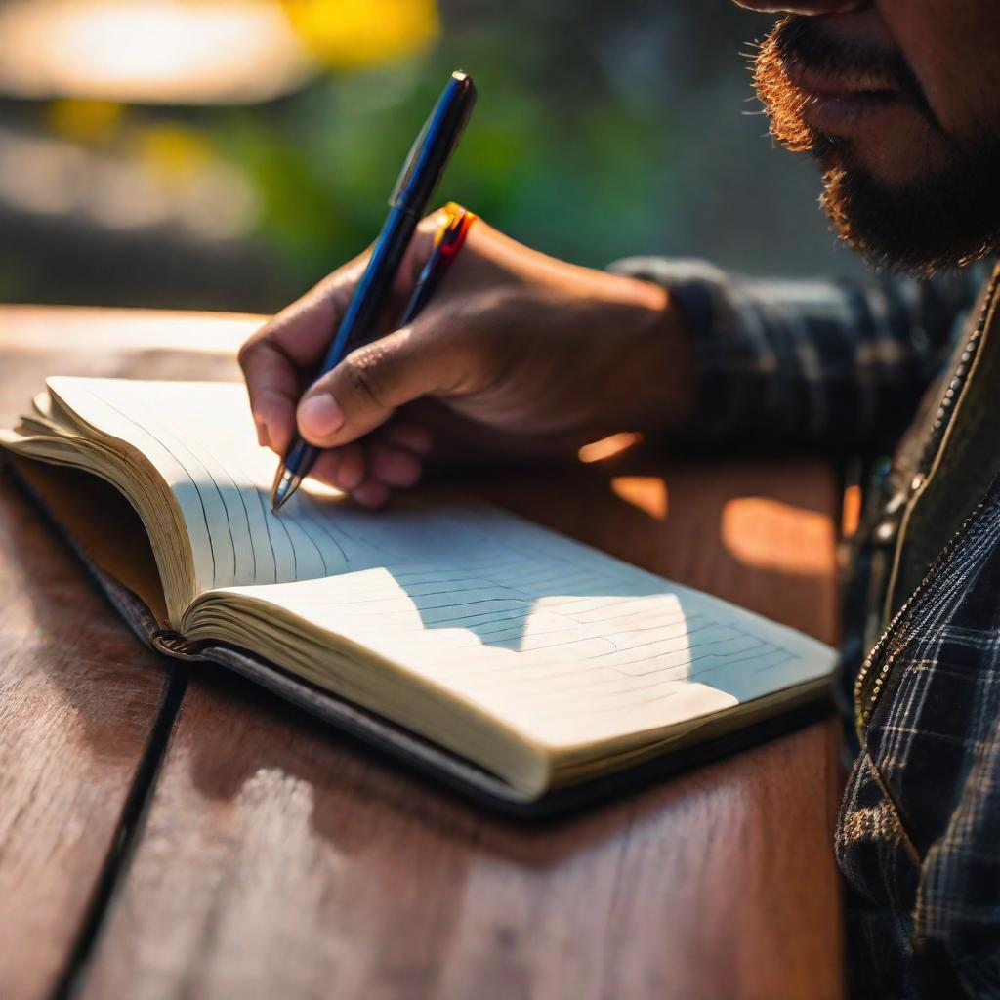


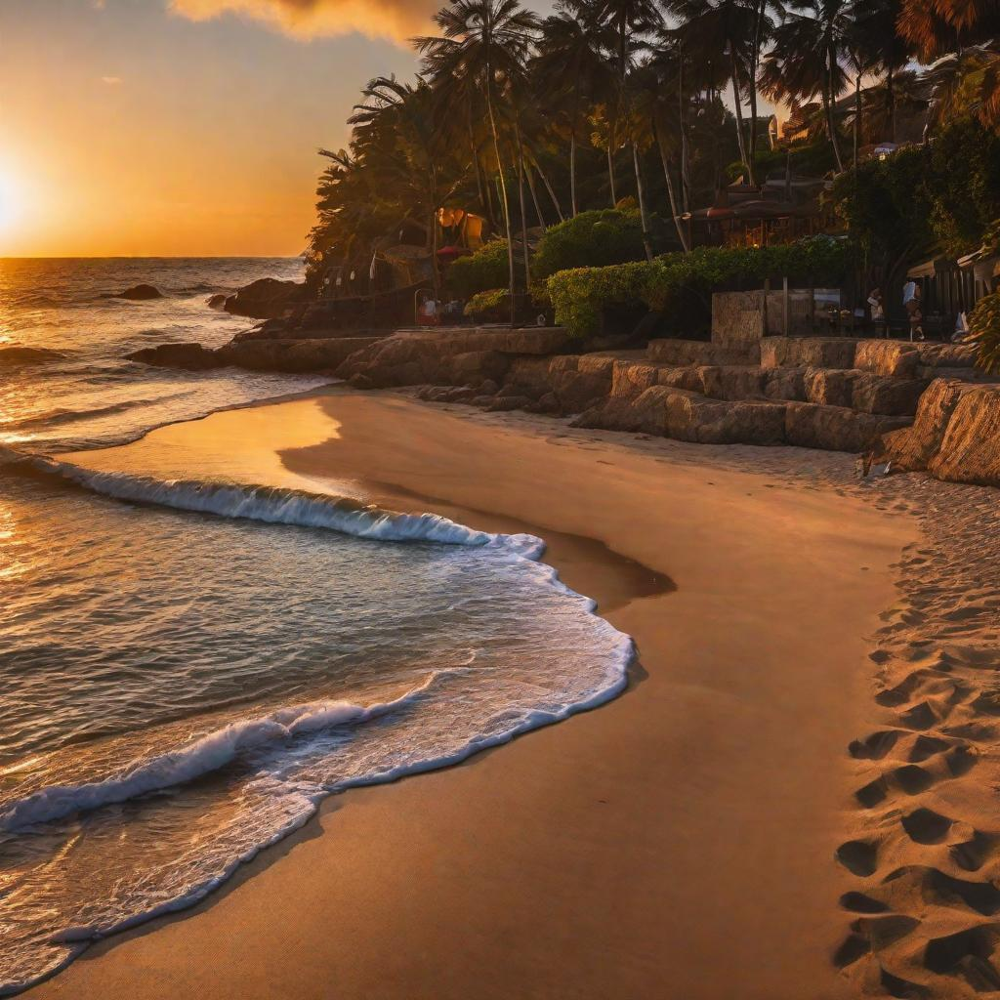
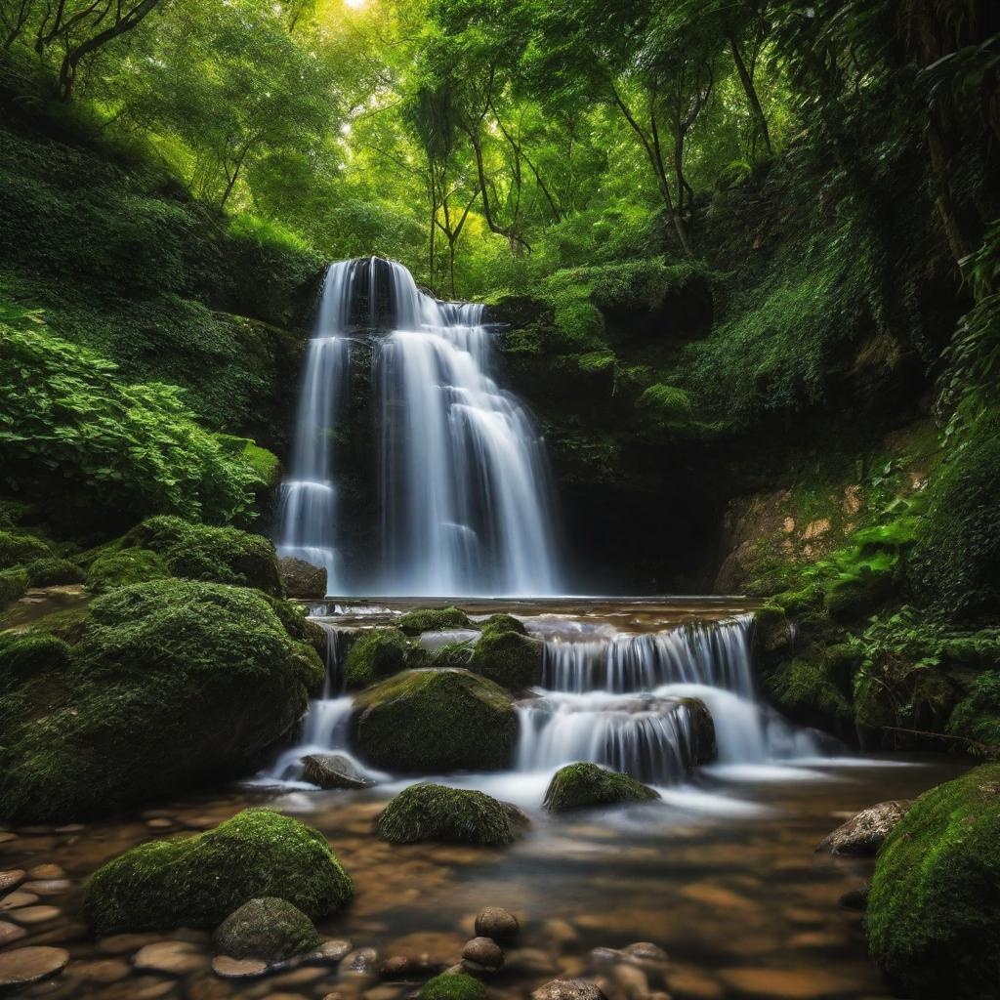
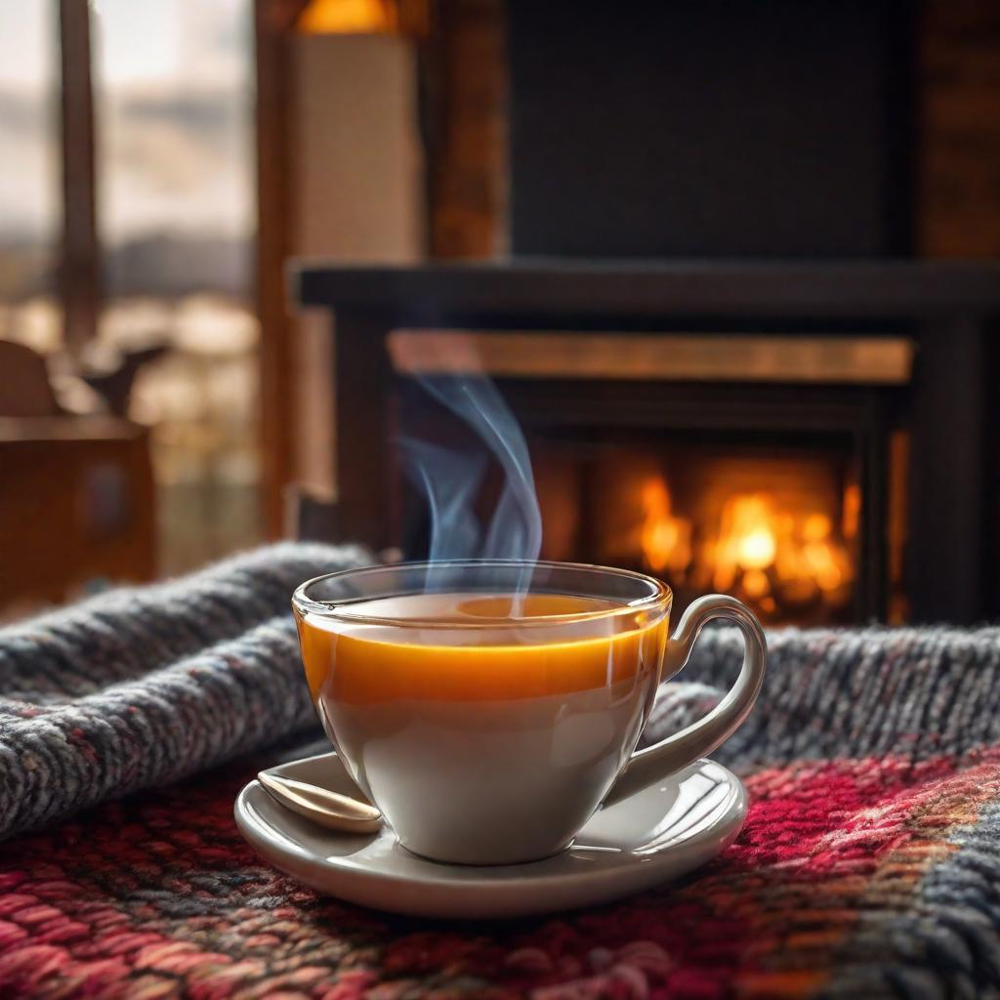
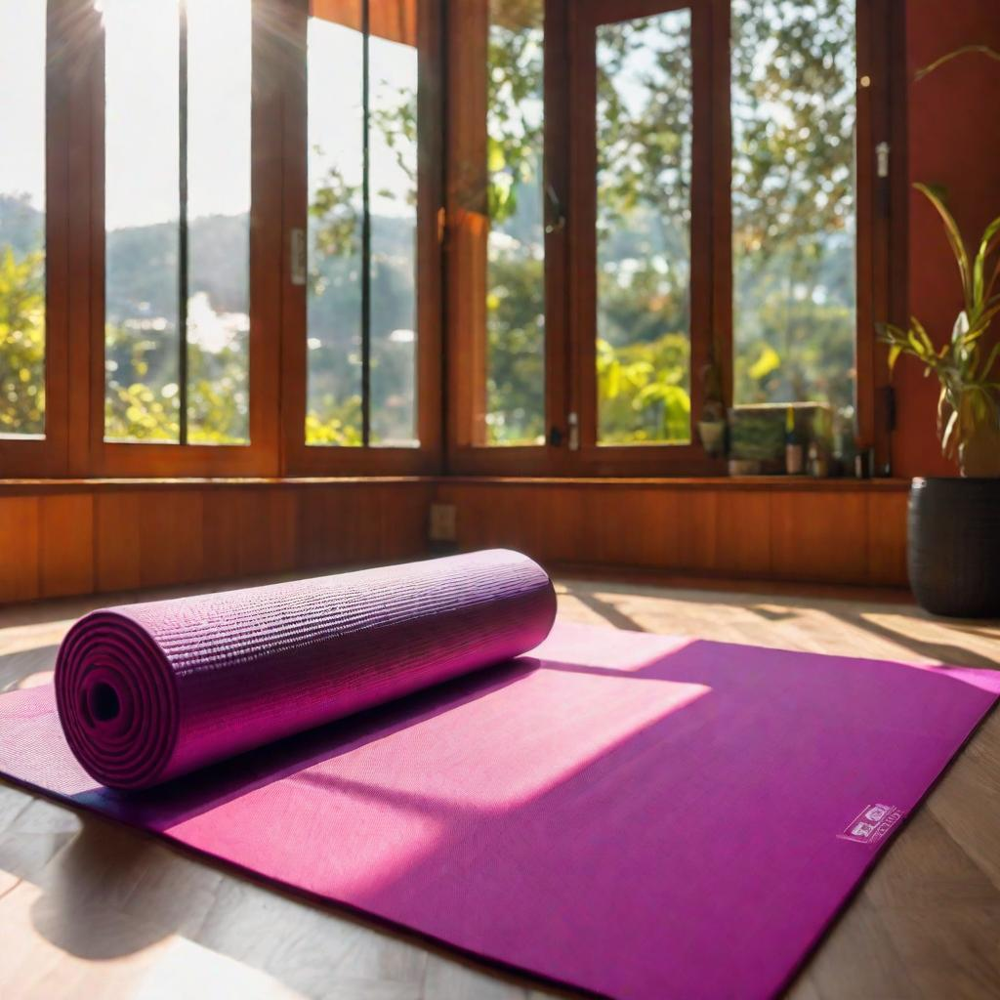
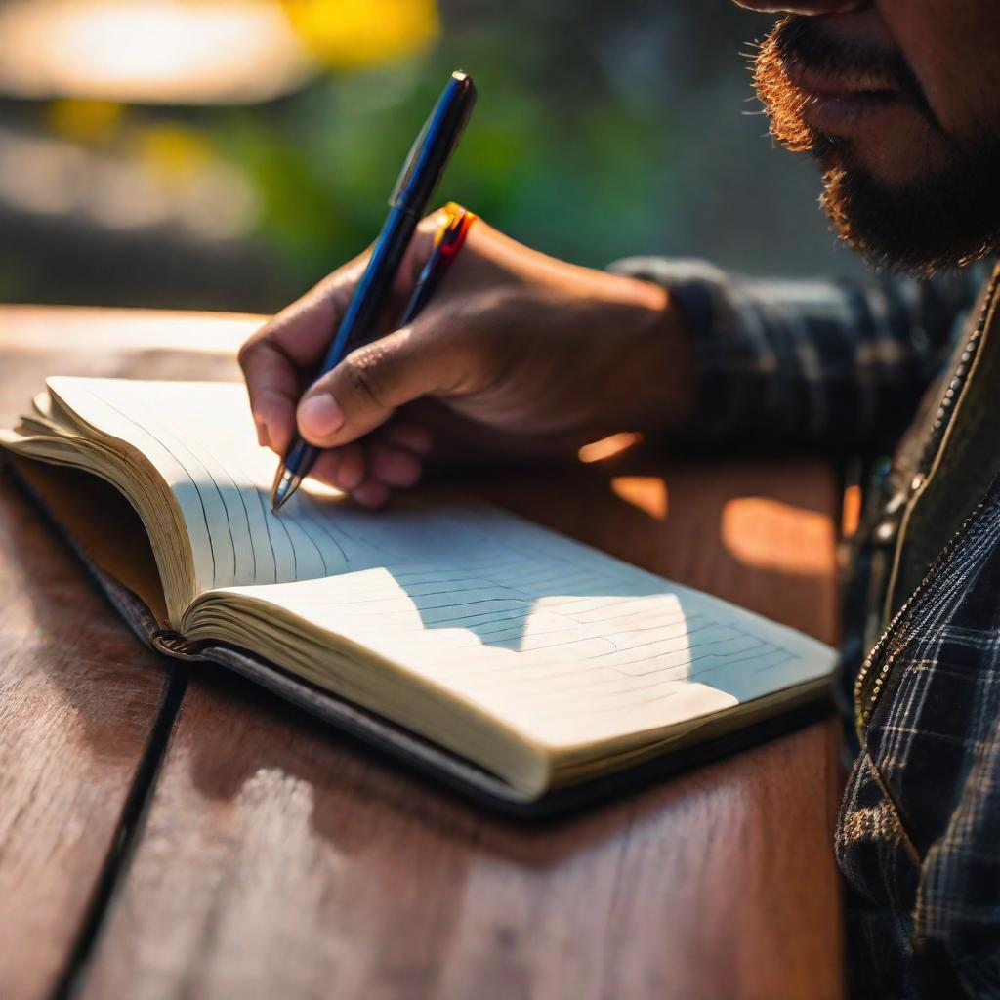

time: 1.89 s (started: 2024-01-14 16:28:03 +00:00)


In [ ]:
import ipyplot
ipyplot.plot_images(images,labels=image_prompts,img_width = 300)

## 3. Convert text to speech using [Elevenlabs](https://elevenlabs.io/) API

In [ ]:
elevenlabsapi = getpass('Enter the openai key: ')

time: 345 µs (started: 2024-01-14 16:28:23 +00:00)


In [ ]:
import requests

def generate_and_save_audio(text, foldername, filename, voice_id, elevenlabs_apikey, model_id="eleven_multilingual_v2", stability=0.4, similarity_boost=0.80):
    url = f"https://api.elevenlabs.io/v1/text-to-speech/{voice_id}"
    headers = {
        "Accept": "audio/mpeg",
        "Content-Type": "application/json",
        "xi-api-key": elevenlabs_apikey
    }

    data = {
        "text": text,
        "model_id": model_id,
        "voice_settings": {
            "stability": stability,
            "similarity_boost": similarity_boost
        }
    }

    response = requests.post(url, json=data, headers=headers)

    if response.status_code != 200:
        print(response.text)
    else:
        file_path = f"{foldername}/{filename}.mp3"
        with open(file_path, 'wb') as f:
            f.write(response.content)

time: 895 µs (started: 2024-01-14 16:28:24 +00:00)


In [ ]:
print (texts)

['Take a moment to connect with nature and find inner peace.', 'Reflect on your thoughts and feelings, journaling can be a mind-clearing practice.', 'Nourish your body with wholesome and vibrant foods.', 'Stretch your body and practice yoga to release tension and improve flexibility.', 'Indulge in aromatherapy and fill your space with relaxing scents.', 'Unwind with a good book and a soothing cup of tea.', 'Ensure quality rest by prioritizing a peaceful and comfortable sleep environment.']
time: 4.38 ms (started: 2024-01-14 16:28:24 +00:00)


In [ ]:

voice_id = "pNInz6obpgDQGcFmaJgB"
for i, text in enumerate(texts):
  output_filename= str(i + 1)
  print (output_filename)
  generate_and_save_audio(text, current_foldername, output_filename, voice_id, elevenlabsapi)

1
2
3
4
5
6
7
time: 16.6 s (started: 2024-01-14 16:28:24 +00:00)


## 4. Install Moviepy to stitch everything

In [ ]:
!pip install --quiet git+https://github.com/Zulko/moviepy.git@bc8d1a831d2d1f61abfdf1779e8df95d523947a5
!pip install --quiet imageio==2.25.1

  Preparing metadata (setup.py) ... done
time: 11.2 s (started: 2024-01-14 16:28:49 +00:00)


In [ ]:
!apt install -qq imagemagick

imagemagick is already the newest version (8:6.9.11.60+dfsg-1.3ubuntu0.22.04.3).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
time: 1.31 s (started: 2024-01-14 16:29:01 +00:00)


In [ ]:
!cat /etc/ImageMagick-6/policy.xml | sed 's/none/read,write/g'> /etc/ImageMagick-6/policy.xml

time: 104 ms (started: 2024-01-14 16:29:02 +00:00)


In [ ]:
from moviepy.editor import AudioFileClip, concatenate_audioclips, concatenate_videoclips, ImageClip
import os
import cv2
import numpy as np

def create_combined_video_audio(mp3_folder, output_filename, output_resolution=(1080, 1920), fps=24):
    mp3_files = sorted([file for file in os.listdir(mp3_folder) if file.endswith(".mp3")])
    mp3_files = sorted(mp3_files, key=lambda x: int(x.split('.')[0]))

    audio_clips = []
    video_clips = []

    for mp3_file in mp3_files:
        audio_clip = AudioFileClip(os.path.join(mp3_folder, mp3_file))
        audio_clips.append(audio_clip)

        # Load the corresponding image for each mp3 and set its duration to match the mp3's duration
        img_path = os.path.join(mp3_folder, f"{mp3_file.split('.')[0]}.jpg")
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB format

        # Resize the original image to 1080x1080
        image_resized = cv2.resize(image, (1080, 1080))

        # Blur the image
        blurred_img = cv2.GaussianBlur(image, (0, 0), 30)
        blurred_img = cv2.resize(blurred_img, output_resolution)

        # Overlay the original image on the blurred one
        y_offset = (output_resolution[1] - 1080) // 2
        blurred_img[y_offset:y_offset+1080, :] = image_resized

        video_clip = ImageClip(np.array(blurred_img), duration=audio_clip.duration)
        video_clips.append(video_clip)

    final_audio = concatenate_audioclips(audio_clips)
    final_video = concatenate_videoclips(video_clips, method="compose")

    # Use set_audio method to set the audio for the video clip
    final_video = final_video.set_audio(final_audio)

    finalpath = mp3_folder+"/"+output_filename

    final_video.write_videofile(finalpath, fps=fps, codec='libx264',audio_codec="aac")

time: 38 ms (started: 2024-01-14 16:32:44 +00:00)


In [ ]:
output_filename = "combined_video.mp4"
create_combined_video_audio(current_foldername, output_filename)

Moviepy - Building video db9ed141-11b9-41a4-9d26-1cfdccdf76c3/combined_video.mp4.
MoviePy - Writing audio in combined_videoTEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video db9ed141-11b9-41a4-9d26-1cfdccdf76c3/combined_video.mp4



Moviepy - Done !
Moviepy - video ready db9ed141-11b9-41a4-9d26-1cfdccdf76c3/combined_video.mp4
time: 24 s (started: 2024-01-14 16:32:47 +00:00)


In [ ]:
from IPython.display import HTML
from base64 import b64encode

output_video_file = current_foldername+"/"+output_filename
mp4 = open(output_video_file,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

time: 26.9 ms (started: 2024-01-14 16:33:18 +00:00)
